# Análisis de datos

Lucía Cordero | Jorge Garcelán

<div class="warning" style='padding:0.1em; border-left: 4px solid #17a2b8; background-color:#e8f8ff;'>
<span>
<p style='margin-top:1em; margin-left:1em; text-align:left'>
<b>🎯 Descripción</b></p>
<p style='margin-left:1em;'>
En este notebook se cargan los datos electorales y demográficos de <b>2024</b> y se realiza un análisis de datos con la visualización de mapas y gráficos.
</p>
</span>
</div>


## Librerías

In [105]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
import requests

## Datasets

In [106]:
# Cargar datos de state, county, fips
state_fips_county = pd.read_csv('data/state_fips_county.csv')
state_names = state_fips_county['state']
fips_codes = state_fips_county['fips'].astype(str).str.zfill(5)
county_names = state_fips_county['county']

### Seleccionar año

In [107]:
CENSUS_YEAR = 2023 # 2015, 2019, 2023
ELECTORAL_YEAR = CENSUS_YEAR + 1

### Cargar datos

In [108]:
data = pd.read_csv(f'data/final_data_{ELECTORAL_YEAR}.csv')

In [109]:
# Volver a definir el diccionario de mapeo de FIPS y nombres de condados en Connecticut
fips_mapping = {
    "09110": ("09001", "Capitol Planning Region"),
    "09120": ("09003", "Greater Bridgeport Planning Region"),
    "09130": ("09005", "Lower Connecticut River Valley Planning Region"),
    "09140": ("09007", "Naugatuck Valley Planning Region"),
    "09150": ("09009", "Northeastern Connecticut Planning Region"),
    "09160": ("09011", "Northwest Hills Planning Region"),
    "09170": ("09013", "South Central Connecticut Planning Region"),
    "09180": ("09015", "Southeastern Connecticut Planning Region"),
}

# Actualizar los valores de 'county_fips' y 'county' en el dataframe
for old_fips, (new_fips, new_county) in fips_mapping.items():
    data.loc[data['county_fips'] == old_fips, ['county_fips', 'county']] = [new_fips, new_county]

data['county_fips'] = data['county_fips'].astype(str).str.zfill(5)
fips_codes = state_fips_county['fips'].astype(str).str.zfill(5)

# Mostrar la tabla actualizada
data[data['state'] == "Connecticut"]

/var/folders/dh/_ks73kfn57l67vxm7b5y16qw0000gn/T/ipykernel_28123/3372067897.py:15: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '09001' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



,state,county_fips,county,votes_gop,votes_dem,total_votes,votes_others,per_votes_others,per_dem,per_gop,...,households_owner_rate,unemployment_rate,public_transport_rate,no_health_insurance_rate,winner,delta_per_dem,delta_per_gop,delta_per_oth,latitude,longitude
279,Connecticut,09120,Greater Bridgeport Planning Region,51519.0,83461.0,137015.0,2035.0,0.014852,0.609138,0.376010,...,65.38,7.43,2.94,8.33,dem,NaN,NaN,NaN,41.803893,-72.732326
280,Connecticut,09130,Lower Connecticut River Valley Planning Region,44318.0,58360.0,104480.0,1802.0,0.017247,0.558576,0.424177,...,75.23,3.88,0.62,3.38,dem,NaN,NaN,NaN,41.791253,-73.245934
281,Connecticut,09140,Naugatuck Valley Planning Region,115290.0,99237.0,217520.0,2993.0,0.013760,0.456220,0.530020,...,67.64,6.10,0.72,4.42,gop,NaN,NaN,NaN,41.459774,-72.539468
282,Connecticut,09150,Northeastern Connecticut Planning Region,29028.0,21165.0,50962.0,769.0,0.015090,0.415309,0.569601,...,76.20,6.23,0.07,3.69,gop,NaN,NaN,NaN,41.417930,-72.928288
283,Connecticut,09160,Northwest Hills Planning Region,31944.0,31137.0,64076.0,995.0,0.015528,0.485939,0.498533,...,75.86,5.43,0.63,3.87,gop,NaN,NaN,NaN,41.488418,-72.110085
284,Connecticut,09170,South Central Connecticut Planning Region,103087.0,156248.0,264854.0,5519.0,0.020838,0.589940,0.389222,...,60.56,5.91,1.54,5.09,dem,NaN,NaN,NaN,41.861181,-72.336335
285,Connecticut,09180,Southeastern Connecticut Planning Region,58392.0,76146.0,136954.0,2416.0,0.017641,0.555997,0.426362,...,65.39,5.07,0.64,4.37,dem,NaN,NaN,NaN,41.829834,-71.986423


## Análisis Exploratorio de Datos

In [110]:
plot_data = data.copy()
plot_data['county_fips'] = plot_data['county_fips'].astype(str).str.zfill(5)
plot_data['state'] = state_names
plot_data

,state,county_fips,county,votes_gop,votes_dem,total_votes,votes_others,per_votes_others,per_dem,per_gop,...,households_owner_rate,unemployment_rate,public_transport_rate,no_health_insurance_rate,winner,delta_per_dem,delta_per_gop,delta_per_oth,latitude,longitude
0,Alabama,01001,Autauga County,20484.0,7439.0,28190.0,267.0,0.009471,0.263888,0.726641,...,74.91,2.54,0.11,7.20,gop,-0.629575,1.227263,-0.597688,32.536153,-86.641196
1,Alabama,01003,Baldwin County,95798.0,24934.0,121808.0,1076.0,0.008834,0.204699,0.786467,...,77.54,3.19,0.04,8.06,gop,-1.939110,2.475350,-0.536240,30.725862,-87.723954
2,Alabama,01005,Barbour County,5606.0,4158.0,9832.0,68.0,0.006916,0.422905,0.570179,...,67.49,5.71,0.07,9.49,gop,-3.497693,3.566674,-0.068982,31.867889,-85.389245
3,Alabama,01007,Bibb County,7572.0,1619.0,9241.0,50.0,0.005411,0.175197,0.819392,...,77.18,9.98,0.04,7.81,gop,-3.178531,3.512920,-0.334389,32.996456,-87.124963
4,Alabama,01009,Blount County,25354.0,2576.0,28115.0,185.0,0.006580,0.091624,0.901796,...,79.51,5.84,0.00,10.11,gop,-0.407009,0.608067,-0.201057,33.985248,-86.569756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3102,Wyoming,56037,Sweetwater County,12541.0,3731.0,16569.0,297.0,0.017925,0.225180,0.756895,...,73.98,5.79,1.14,12.85,gop,-0.508004,2.034177,-1.526173,41.660236,-108.879456
3103,Wyoming,56039,Teton County,4134.0,8748.0,13077.0,195.0,0.014912,0.668961,0.316128,...,61.53,2.45,1.31,10.00,dem,-0.202104,2.035866,-1.833762,43.935079,-110.589127
3104,Wyoming,56041,Uinta County,7282.0,1561.0,8984.0,141.0,0.015695,0.173753,0.810552,...,76.53,3.51,0.44,10.85,gop,0.453402,1.327492,-1.780894,41.287415,-110.547551
3105,Wyoming,56043,Washakie County,3125.0,656.0,3841.0,60.0,0.015621,0.170789,0.813590,...,74.19,2.03,0.01,12.22,gop,0.852565,0.476668,-1.329233,43.904771,-107.681649


#### Mapa vacío

In [111]:
# Crear mapa coroplético de condados
fig = px.choropleth(
    data_frame=plot_data,
    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
    locations=plot_data['county_fips'],
    color='winner',
    hover_name=plot_data['county'],
    scope='usa',  # Mostrar todo Estados Unidos
    color_discrete_map={
        "dem": "lightgray",
        "gop": "lightgray"
    }
)

# Layout sin plantilla y con fondo transparente
fig.update_layout(
    template=None,  # Evita que alguna plantilla añada fondo
    title_text="",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r":0, "t":50, "l":0, "b":0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# Quitar (o minimizar) las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Cargar geojson de fronteras estatales
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()

# Agregar capa de fronteras de estados con líneas más gruesas
fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],  # Sin relleno
    marker_line_width=1,        # Grosor de línea aumentado para fronteras estatales
    marker_line_color="black",  # Color de línea
    showscale=False,            # No mostrar escala para esta capa
    hoverinfo='none'            # Ocultar información al pasar el ratón
))

# Ajustar la visualización geográfica
fig.update_geos(
    # Si usas scope='usa', no es imprescindible center ni projection_scale;
    # pero si ves mucho espacio vacío, puedes forzar un escalado.
    scope='usa',
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)

fig.update_layout(
    coloraxis_showscale=False,  # Ocultar barra de color
    showlegend=False            # Ocultar leyenda
)


# Exportar en PNG y PDF con fondo transparente
fig.write_image("imgs/mapa_county_state_gray.png", scale=10, engine="kaleido")
fig.write_image("imgs/mapa_county_state_gray.pdf", scale=10, engine="kaleido")

# Mostrar en pantalla
fig.show()

#### Mapa de un condado en concreto

In [112]:
# Asegurarse de que la columna 'county_fips' es de tipo string
plot_data['county_fips'] = plot_data['county_fips'].astype(str)

# Filtrar para solo los condados de Georgia (códigos FIPS que comienzan con "13")
plot_data_georgia = plot_data[plot_data['county_fips'].str.startswith("13")].copy()

# Asignar colores: si el condado es "13121", se usa el valor de 'winner'; de lo contrario, se asigna "other"
plot_data_georgia['color'] = plot_data_georgia.apply(
    lambda row: row['winner'] if row['county_fips'] == "13121" else "other", axis=1
)

# Crear el mapa coroplético solo para Georgia
fig = px.choropleth(
    data_frame=plot_data_georgia,
    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
    locations=plot_data_georgia['county_fips'],
    color='color',
    hover_name=plot_data_georgia['county'],
    scope='usa',
    color_discrete_map={
        "dem": "#254995",
        "gop": "#d12533",
        "other": "lightgray"  # Los demás condados en gris
    }
)

# Configuración del layout con fondo transparente
fig.update_layout(
    template=None,
    title_text="Mapa de condados de Georgia (resaltando el condado 13121)",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Cargar geojson de fronteras estatales y agregar capa de estados
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()
fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],  # Sin relleno
    marker_line_width=1,        # Líneas de mayor grosor para fronteras estatales
    marker_line_color="black",
    showscale=False,
    hoverinfo='none'
))

# Ajustar la visualización geográfica para centrar en Georgia
fig.update_geos(
    scope='usa',
    fitbounds="locations",  # Ajusta el mapa para encuadrar solo los datos
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)
fig.update_layout(
    coloraxis_showscale=False,
    showlegend=False
)

# Exportar en PNG y PDF con fondo transparente
fig.write_image(f"imgs/fulton_georgia_winner_{ELECTORAL_YEAR}.png", scale=10, engine="kaleido")
fig.write_image(f"imgs/fulton_georgia_winner_{ELECTORAL_YEAR}.pdf", scale=10, engine="kaleido")

# Mostrar el mapa
fig.show()


#### Ganador por condado

In [113]:
plot_data['winner'].value_counts()

winner
gop    2685
dem     422
Name: count, dtype: int64

In [114]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=plot_data['county_fips'],
                    color='winner',
                    hover_name=plot_data['county'],
                    scope='usa',  # Mostrar todo Estados Unidos
                    color_discrete_map={
                        "dem": "#254995",
                        "gop": "#d12533"
                    }
                )

# Layout sin plantilla y con fondo transparente
fig.update_layout(
    template=None,  # Evita que alguna plantilla añada fondo
    title_text="",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r":0, "t":50, "l":0, "b":0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# Ajustar la visualización geográfica
fig.update_geos(
    # Si usas scope='usa', no es imprescindible center ni projection_scale;
    # pero si ves mucho espacio vacío, puedes forzar un escalado.
    scope='usa',
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)

# Ajustar el trazo de los condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

fig.update_layout(
    coloraxis_showscale=False,  # Ocultar barra de color
    showlegend=False            # Ocultar leyenda
)

# Exportar en PNG y PDF con fondo transparente
fig.write_image("imgs/mapa_county_winner.png", scale=10, engine="kaleido")
fig.write_image("imgs/mapa_county_winner.pdf", scale=10, engine="kaleido")

# Mostrar en pantalla
fig.show()


In [115]:
import plotly.express as px
import plotly.graph_objects as go
import requests

# Crear mapa coroplético de condados
fig = px.choropleth(
    data_frame=plot_data,
    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
    locations=plot_data['county_fips'],
    color='winner',
    hover_name=plot_data['county'],
    scope='usa',  # Mostrar todo Estados Unidos
    color_discrete_map={
        "dem": "#254995",
        "gop": "#d12533"
    }
)

# Layout sin plantilla y con fondo transparente
fig.update_layout(
    template=None,  # Evita que alguna plantilla añada fondo
    title_text="",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r":0, "t":50, "l":0, "b":0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# Quitar (o minimizar) las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Cargar geojson de fronteras estatales
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()

# Agregar capa de fronteras de estados con líneas más gruesas
fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],  # Sin relleno
    marker_line_width=1,        # Grosor de línea aumentado para fronteras estatales
    marker_line_color="black",  # Color de línea
    showscale=False,            # No mostrar escala para esta capa
    hoverinfo='none'            # Ocultar información al pasar el ratón
))

# Ajustar la visualización geográfica
fig.update_geos(
    # Si usas scope='usa', no es imprescindible center ni projection_scale;
    # pero si ves mucho espacio vacío, puedes forzar un escalado.
    scope='usa',
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)

fig.update_layout(
    coloraxis_showscale=False,  # Ocultar barra de color
    showlegend=False            # Ocultar leyenda
)


# Exportar en PNG y PDF con fondo transparente
fig.write_image(f"imgs/mapa_county_state_winner_{ELECTORAL_YEAR}.png", scale=10, engine="kaleido")
fig.write_image(f"imgs/mapa_county_state_winner_{ELECTORAL_YEAR}.pdf", scale=10, engine="kaleido")

# Mostrar en pantalla
fig.show()

#### Ganador por condado + población

In [116]:
# Parámetro: número de ciudades (o condados) con mayor población que queremos mostrar por estado.
top_n = 3

# Filtrar las top 'top_n' ciudades por estado
# Se ordena de mayor a menor población y se agrupa por estado.
top_cities = plot_data.sort_values("pop_total", ascending=False).groupby("state", group_keys=False).head(top_n)

# Crear el mapa coroplético de condados
fig = px.choropleth(
    data_frame=plot_data,
    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
    locations=plot_data['county_fips'],
    color='winner',
    hover_name=plot_data['county'],
    scope='usa',
    color_discrete_map={
        "dem": "#254995",
        "gop": "#d12533"
    }
)

# Layout sin plantilla y con fondo transparente
fig.update_layout(
    template=None,  # Evita que alguna plantilla añada fondo
    title_text="",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r":0, "t":50, "l":0, "b":0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# Minimizar las líneas divisorias entre condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Agregar la capa de fronteras estatales con líneas más gruesas
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()

fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],
    marker_line_width=1,  # Líneas estatales más gruesas
    marker_line_color="black",
    showscale=False,
    hoverinfo='none'
))

# Ajustar la visualización geográfica del mapa
fig.update_geos(
    # Si usas scope='usa', no es imprescindible center ni projection_scale;
    # pero si ves mucho espacio vacío, puedes forzar un escalado.
    scope='usa',
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)

# Calcular el tamaño de las burbujas para las ciudades seleccionadas.
# Se escala para que la ciudad (o condado) con mayor población tenga, por ejemplo, tamaño 1000.
top_cities['bubble_size'] = (top_cities['pop_total'] / top_cities['pop_total'].max()) * 1000

# Agregar la capa de burbujas con las top ciudades por estado
fig.add_trace(go.Scattergeo(
    lon = top_cities['longitude'],
    lat = top_cities['latitude'],
    mode = 'markers+text',
    marker = dict(
        size = top_cities['bubble_size'],
        color = 'gray',
        opacity = 0.5,
        sizemode = 'area',
        line = dict(width=1, color='white')
    ),
    name = f"Habitantes"
))

fig.update_layout(
    coloraxis_showscale=False,  # Ocultar barra de color
    showlegend=False            # Ocultar leyenda
)


# Exportar en PNG y PDF con fondo transparente
fig.write_image("imgs/mapa_county_state_winner_population.png", scale=10, engine="kaleido")
fig.write_image("imgs/mapa_county_state_winner_population.pdf", scale=10, engine="kaleido")


fig.show()


#### Población

##### Población total

In [117]:
plot_data['log_pop_total'] = np.log(plot_data['pop_total'])

# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='log_pop_total',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del número de habitantes (log) por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS
# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


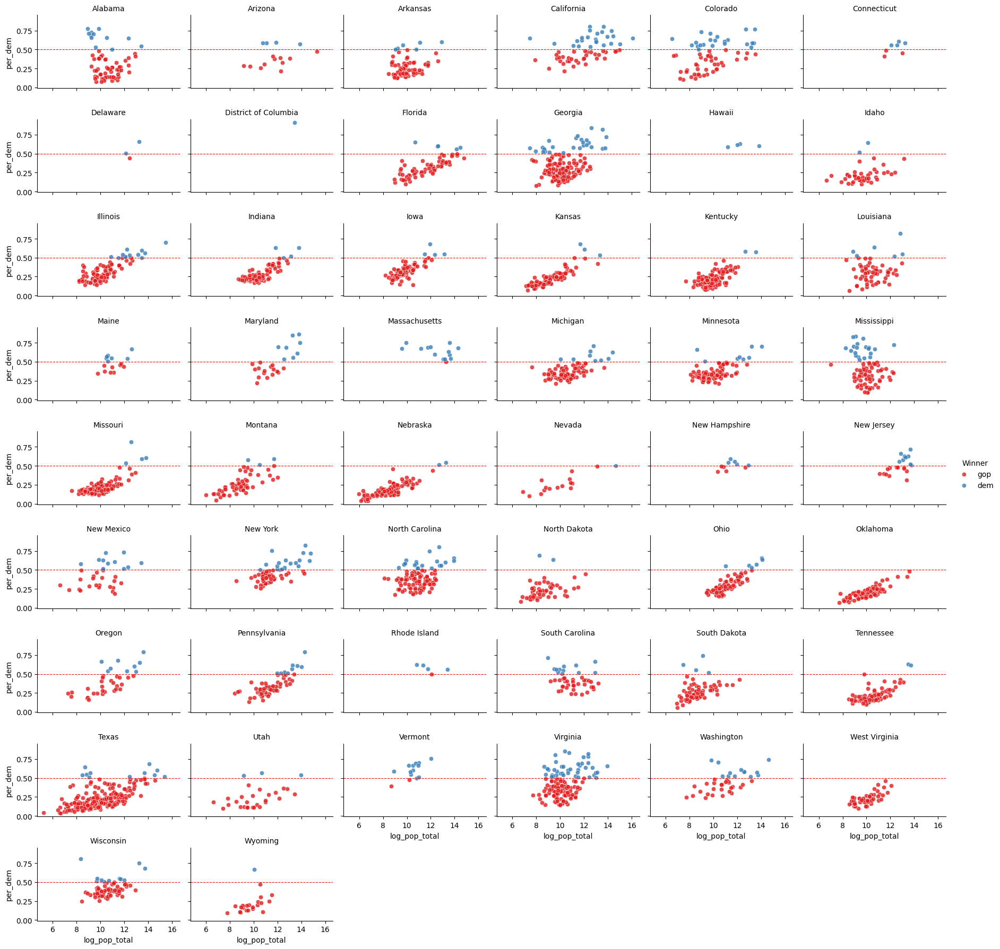

In [118]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'log_pop_total', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)


g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('log_pop_total', 'per_dem')

plt.show()

##### Edad Mediana de la Población

In [119]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='median_age',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la edad (mediana) por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


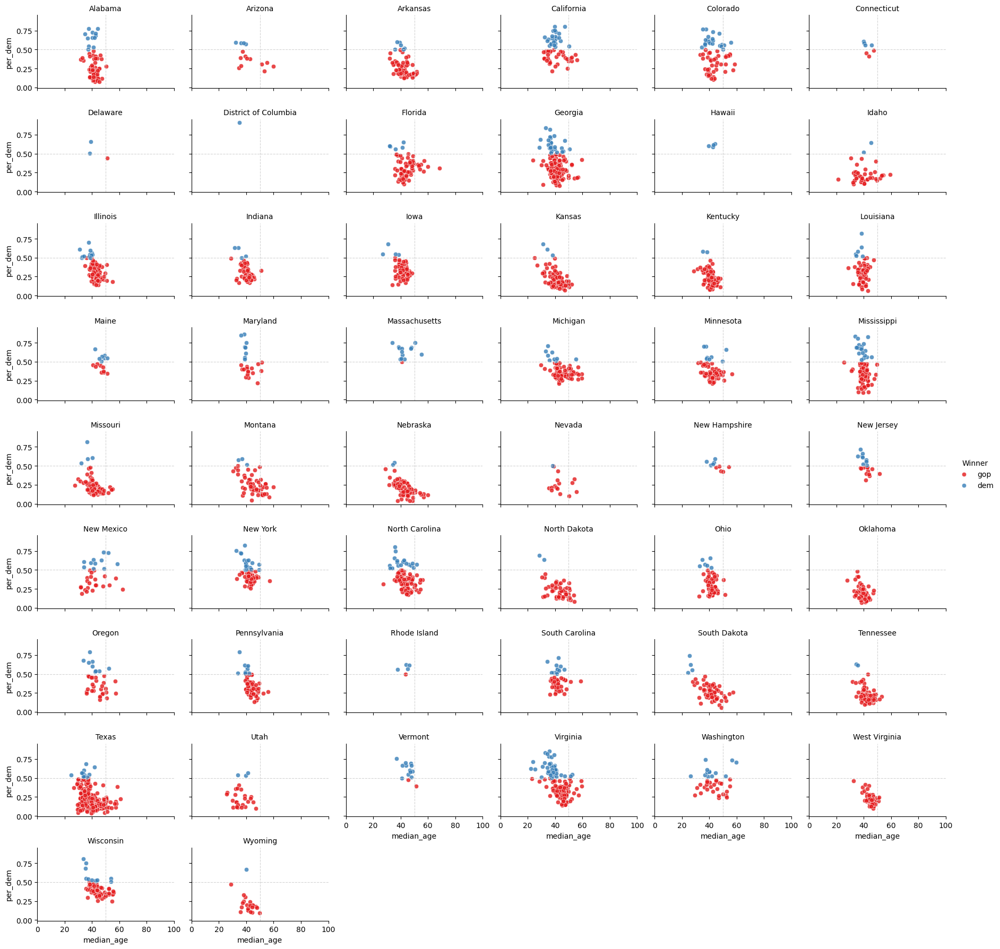

In [120]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='lightgray', lw=0.8)  # Línea horizontal en 50%
    ax.axvline(50, ls='--', color='lightgray', lw=0.8)  # Línea vertical en 50
    ax.set_xlim(0, 100)  # Ajustar el eje X hasta 100


# Scatterplot
g.map(sns.scatterplot, 'median_age', 'per_dem', alpha=0.8)


g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('median_age', 'per_dem')

plt.show()

##### Porcentaje de hombres por condado

In [121]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='pop_total_male_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del porcentaje de hombres por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


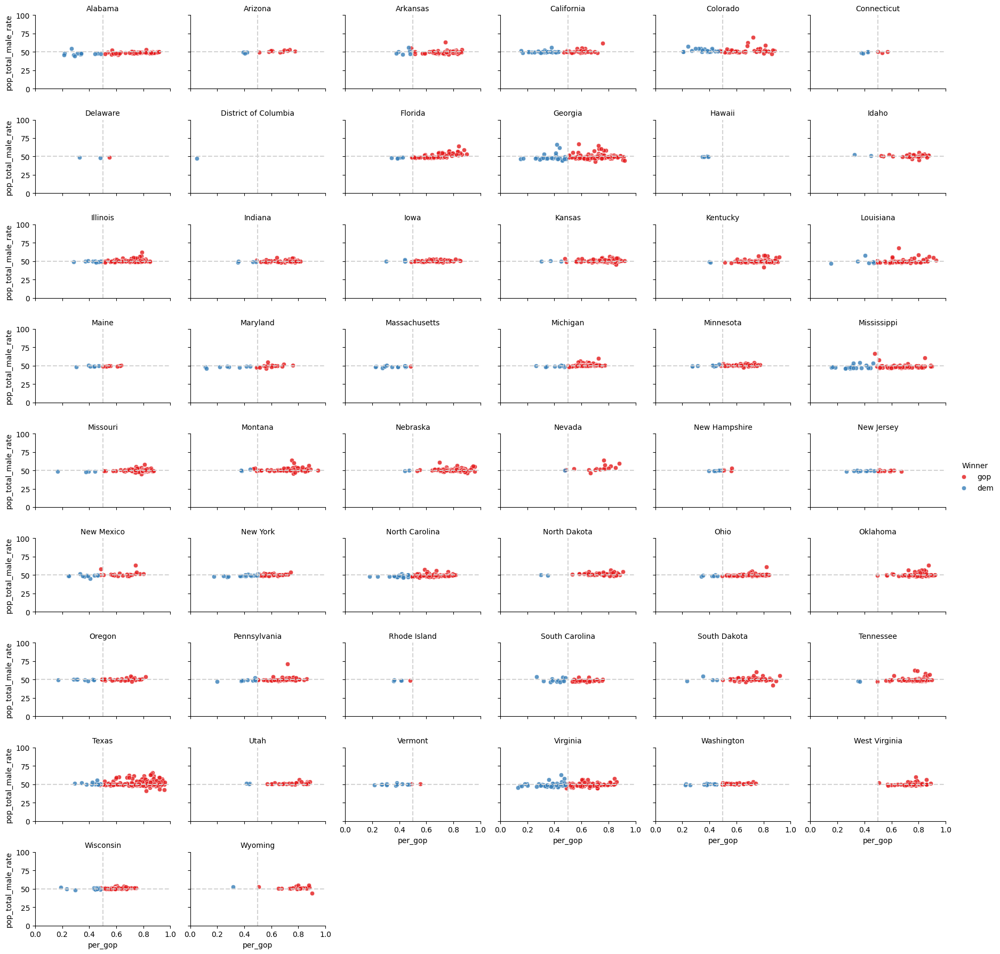

In [122]:
# Crear gráfico facetgrid con ejes intercambiados
g = sns.FacetGrid(plot_data, col='state', hue="winner", col_wrap=6, height=2, aspect=1.5, 
                   palette={"dem": "#377eb8", "gop": "#e41a1c"})

# Añadir líneas de referencia para los nuevos ejes:
# Línea vertical en 0.50 para el eje X (per_dem) y línea horizontal en 50 para el eje Y (pop_total_male_rate)
for ax in g.axes.flat:
    ax.axvline(0.50, ls='--', color='lightgray')  # Línea vertical en 0.50
    ax.axhline(50, ls='--', color='lightgray')     # Línea horizontal en 50
    ax.set_xlim(0, 1)   # Ajustar el eje X para per_dem (asumiendo que va de 0 a 1)
    ax.set_ylim(0, 100) # Ajustar el eje Y para pop_total_male_rate

# Scatterplot con ejes intercambiados:
# Ahora 'per_dem' se coloca en el eje X y 'pop_total_male_rate' en el eje Y
g.map(sns.scatterplot, 'per_gop', 'pop_total_male_rate', alpha=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('per_gop', 'pop_total_male_rate')

plt.show()


##### Porcentaje de mujeres por condado

In [123]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='pop_total_female_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del porcentaje de hombres por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


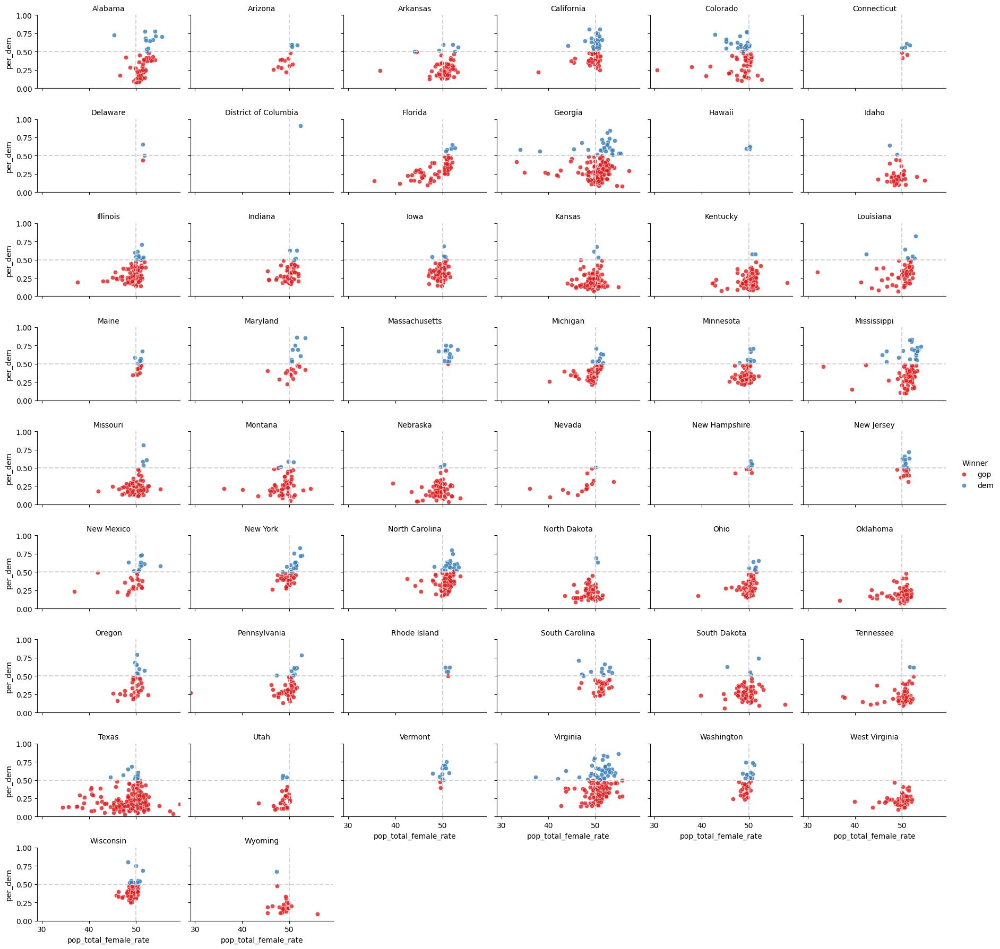

In [124]:
# Crear gráfico facetgrid con ejes intercambiados
g = sns.FacetGrid(plot_data, col='state', hue="winner", col_wrap=6, height=2, aspect=1.5, 
                   palette={"dem": "#377eb8", "gop": "#e41a1c"})

# Añadir líneas de referencia para los nuevos ejes:
# Línea vertical en 0.50 para el eje X (per_dem) y línea horizontal en 50 para el eje Y (pop_total_male_rate)
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='lightgray')  # Línea vertical en 0.50
    ax.axvline(50, ls='--', color='lightgray')     # Línea horizontal en 50
    ax.set_ylim(0, 1)   # Ajustar el eje X para per_dem (asumiendo que va de 0 a 1)
    ax.set_xlim(min(plot_data['pop_total_female_rate']), max(plot_data['pop_total_female_rate'])) # Ajustar el eje Y para pop_total_male_rate

# Scatterplot con ejes intercambiados:
# Ahora 'per_dem' se coloca en el eje X y 'pop_total_male_rate' en el eje Y
g.map(sns.scatterplot, 'pop_total_female_rate', 'per_dem', alpha=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('pop_total_female_rate', 'per_dem')

plt.show()


##### Edad

In [125]:
# Combinar variables: tasa total para cada grupo de edad
plot_data['pop_18_39_total_rate'] = plot_data['pop_18_39_male_rate'] + plot_data['pop_18_39_female_rate']
plot_data['pop_40_64_total_rate'] = plot_data['pop_40_64_male_rate'] + plot_data['pop_40_64_female_rate']
plot_data['pop_over_65_total_rate'] = plot_data['pop_over_65_male_rate'] + plot_data['pop_over_65_female_rate']

# También podrías combinar todos los grupos en una sola tasa total, si es relevante:
plot_data['pop_total_rate'] = (plot_data['pop_18_39_total_rate'] +
                               plot_data['pop_40_64_total_rate'] +
                               plot_data['pop_over_65_total_rate'])

# Lista de variables combinadas para el menú (puedes modificarla según lo que te interese)
cols = [
    'pop_18_39_total_rate',
    'pop_40_64_total_rate',
    'pop_over_65_total_rate',
    'pop_total_rate'
]

# GeoJSON de condados y estados
county_geojson = 'https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json'
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()

# Crear la figura y añadir una traza por cada variable combinada
fig = go.Figure()
for i, col in enumerate(cols):
    fig.add_trace(go.Choropleth(
        geojson=county_geojson,
        locations=plot_data['county_fips'],
        z=plot_data[col],
        text=plot_data['county'],
        colorscale='Viridis',
        colorbar_title=col,
        zmin=0,
        zmax=plot_data[col].max(),
        marker_line_width=0.5,
        marker_line_color="black",
        visible=(i == 0)  # Se muestra solo la primera traza inicialmente
    ))

# Agregar la capa de fronteras estatales (siempre visible)
fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],
    marker_line_width=1,
    marker_line_color="black",
    showscale=False,
    hoverinfo='none'
))

# Configurar layout y menú desplegable para cambiar la variable visualizada
fig.update_layout(
    title_text="Distribución de tasas demográficas combinadas por condado",
    geo=dict(
        scope='usa',
        fitbounds="locations",
        visible=False
    ),
    width=1200,
    height=800,
    updatemenus=[{
        "buttons": [
            {
                "args": [
                    {"visible": [j == i for j in range(len(cols))] + [True]},
                    {"title": f"Distribución de {cols[i]} por condado"}
                ],
                "label": cols[i],
                "method": "update"
            } for i in range(len(cols))
        ],
        "direction": "down",
        "pad": {"r": 10, "t": 10},
        "showactive": True,
        "x": 0.1,
        "xanchor": "left",
        "y": 1.1,
        "yanchor": "top"
    }]
)

fig.show()


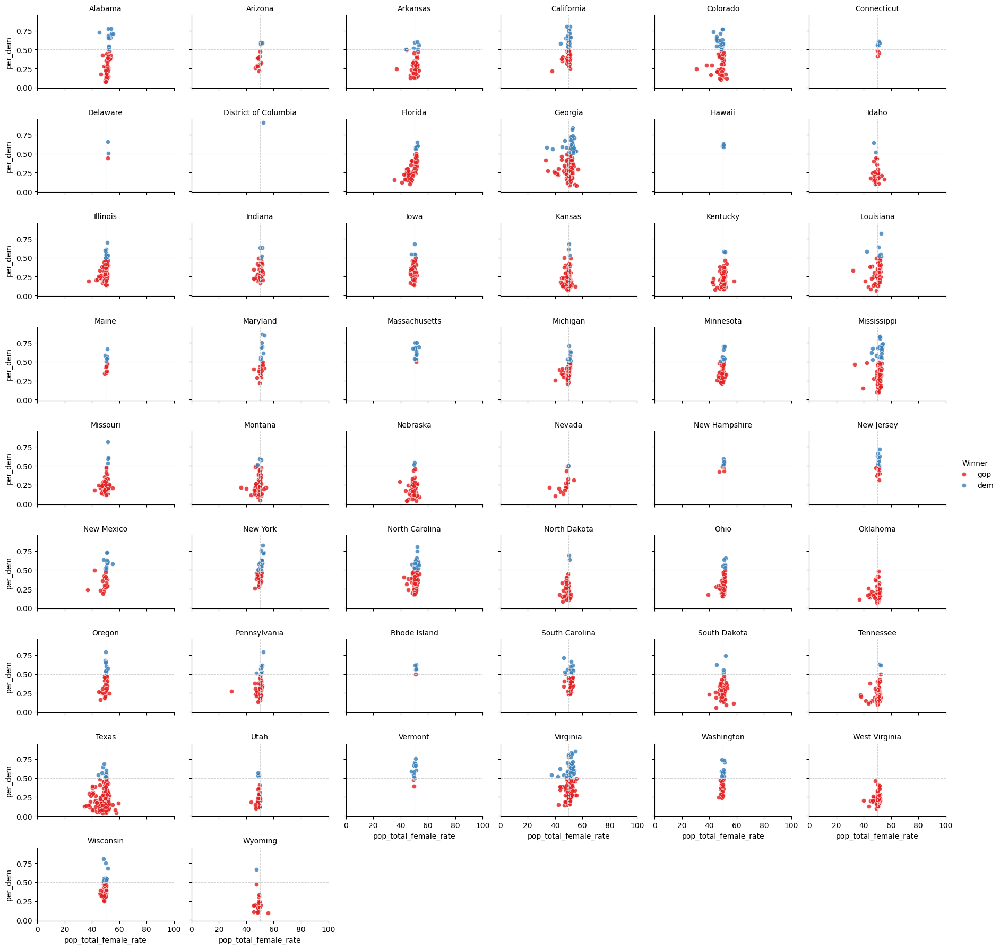

In [126]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='lightgray', lw=0.8)  # Línea horizontal en 50%
    ax.axvline(50, ls='--', color='lightgray', lw=0.8)  # Línea vertical en 50
    ax.set_xlim(0, 100)  # Ajustar el eje X hasta 100


# Scatterplot
g.map(sns.scatterplot, 'pop_total_female_rate', 'per_dem', alpha=0.8)



g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('pop_total_female_rate', 'per_dem')

plt.show()

#### Educación

##### Porcentaje de población con título de secundaria (High School) por condado

In [127]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='high_school_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Dsitribución de la población con título de secundaria por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


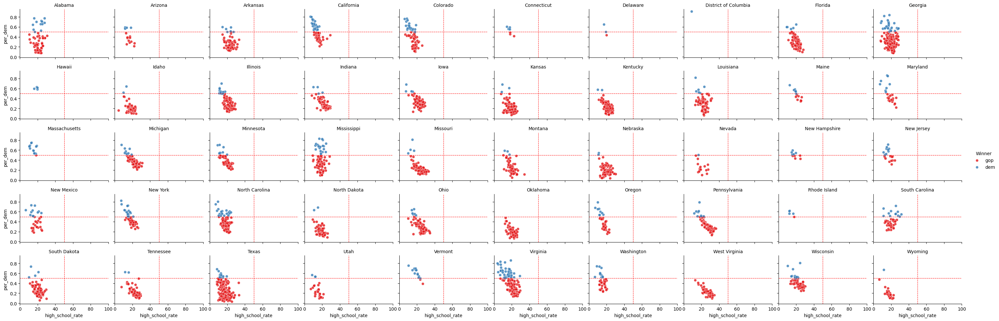

In [128]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'high_school_rate', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='red', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('high_school_rate', 'per_dem')

plt.show()

##### Porcentaje de población con título universitario (Bachelors) por condado

In [129]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=plot_data['county_fips'],
                    color='bachelors_rate',
                    hover_name=plot_data['county'],
                    scope='usa'
                   )

# Layout sin plantilla y con fondo transparente
fig.update_layout(
    template=None,  # Evita que alguna plantilla añada fondo
    title_text="",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r":0, "t":50, "l":0, "b":0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# Quitar (o minimizar) las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Cargar geojson de fronteras estatales
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()

# Agregar capa de fronteras de estados con líneas más gruesas
fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],  # Sin relleno
    marker_line_width=1,        # Grosor de línea aumentado para fronteras estatales
    marker_line_color="black",  # Color de línea
    showscale=False,            # No mostrar escala para esta capa
    hoverinfo='none'            # Ocultar información al pasar el ratón
))

# Ajustar la visualización geográfica
fig.update_geos(
    # Si usas scope='usa', no es imprescindible center ni projection_scale;
    # pero si ves mucho espacio vacío, puedes forzar un escalado.
    scope='usa',
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)

fig.update_layout(
    coloraxis_showscale=False,  # Ocultar barra de color
    showlegend=False            # Ocultar leyenda
)

# Exportar en PNG y PDF con fondo transparente
fig.write_image("imgs/mapa_county_bachelors.png", scale=10, engine="kaleido")
fig.write_image("imgs/mapa_county_bachelors.pdf", scale=10, engine="kaleido")

# Mostrar en pantalla
fig.show()


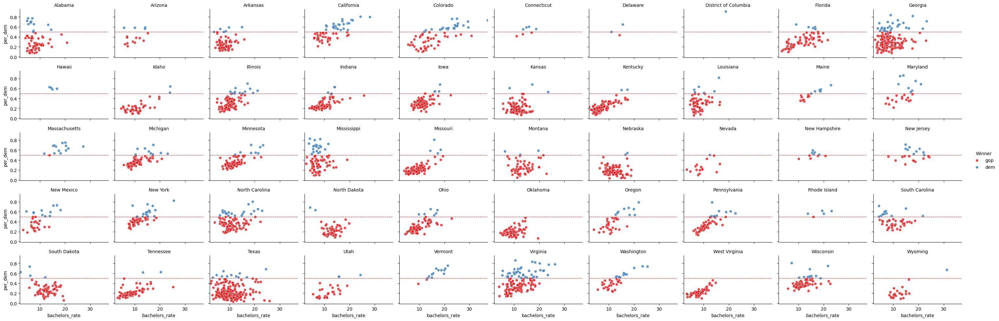

In [130]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'bachelors_rate', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='red', lw=0.8)
    ax.set_xlim(min(plot_data['bachelors_rate']), max(plot_data['bachelors_rate']))

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('bachelors_rate', 'per_dem')

plt.show()

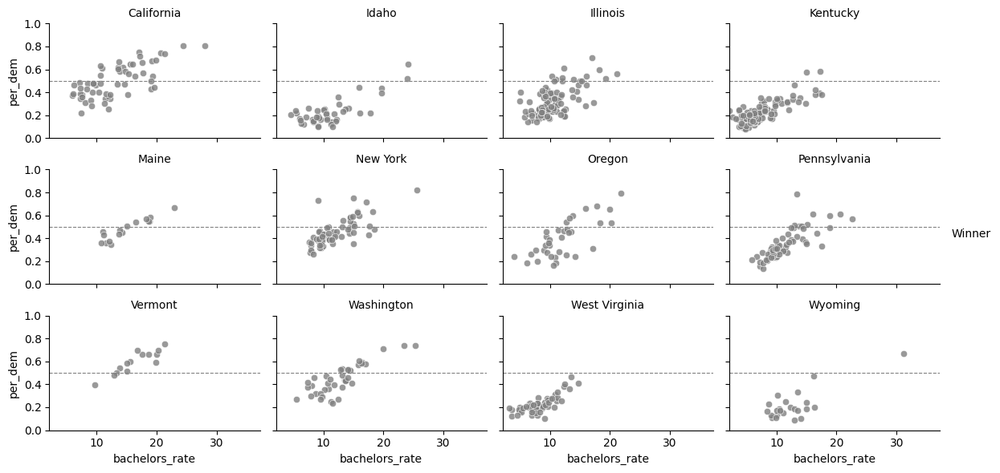

In [131]:
# Lista de estados a mostrar (modifica según tus necesidades)
selected_states = ['California', 'Idaho', 'Illinois', 'Kentucky', 'Maine', 'New York', 'Oregon', 'Pennsylvania', 'Vermont', 'Washington', 'West Virginia', 'Wyoming']

# Filtrar el DataFrame para incluir solo los estados seleccionados
filtered_data = plot_data[plot_data['state'].isin(selected_states)]

# Crear gráfico FacetGrid con los estados filtrados
g = sns.FacetGrid(filtered_data, col='state', col_wrap=int(len(selected_states)//3), 
                  height=2, aspect=1.5)
g.map(sns.scatterplot, 'bachelors_rate', 'per_dem', color="gray", alpha=0.8)

# Añadir líneas horizontales y verticales
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='gray', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_ylim(0, 1)   # Ajustar el eje X para per_gop (asumiendo que va de 0 a 1)
    ax.set_xlim(min(plot_data['bachelors_rate']), max(plot_data['bachelors_rate']))

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('bachelors_rate', 'per_dem')

# Guardar el gráfico en PDF y PNG con fondo transparente
g.fig.savefig('imgs/scatter_bachelors_gray.pdf', transparent=True)
g.fig.savefig('imgs/scatter_bachelors_gray.png', transparent=True)

plt.show()


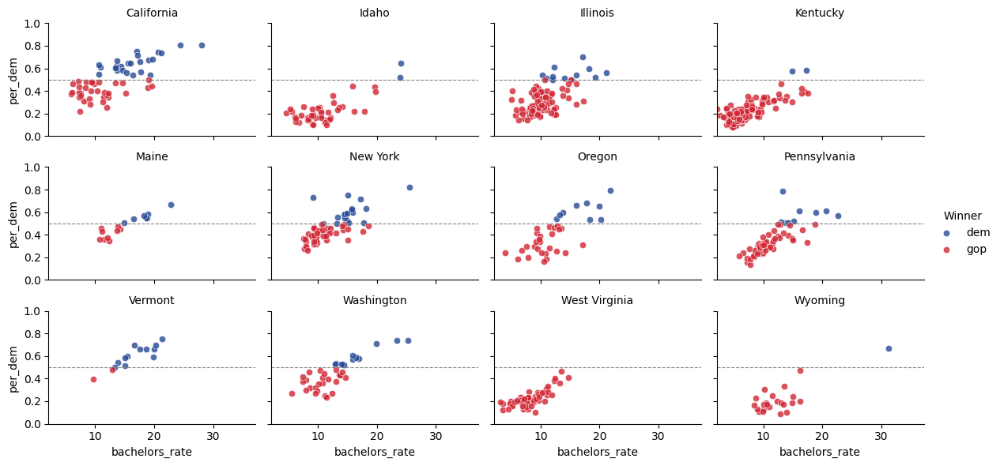

In [132]:
# Lista de estados a mostrar (modifica según tus necesidades)
selected_states = ['California', 'Idaho', 'Illinois', 'Kentucky', 'Maine', 'New York', 'Oregon', 'Pennsylvania', 'Vermont', 'Washington', 'West Virginia', 'Wyoming']

# Filtrar el DataFrame para incluir solo los estados seleccionados
filtered_data = plot_data[plot_data['state'].isin(selected_states)]

# Crear gráfico FacetGrid con los estados filtrados
g = sns.FacetGrid(filtered_data, col='state', hue="winner", col_wrap=int(len(selected_states)//3), 
                  height=2, aspect=1.5, palette={"gop": "#d12533", "dem": "#254995"})
g.map(sns.scatterplot, 'bachelors_rate', 'per_dem', alpha=0.8)

# Añadir líneas horizontales y verticales
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='gray', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_ylim(0, 1)   # Ajustar el eje X para per_gop (asumiendo que va de 0 a 1)
    ax.set_xlim(min(plot_data['bachelors_rate']), max(plot_data['bachelors_rate']))

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('bachelors_rate', 'per_dem')

# Guardar el gráfico en PDF y PNG con fondo transparente
g.fig.savefig('imgs/scatter_bachelors.pdf', transparent=True)
g.fig.savefig('imgs/scatter_bachelors.png', transparent=True)

plt.show()


#### Raza y Etnia

##### Porcentaje de población blanca (White) por condado

In [133]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='white_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población blanca por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


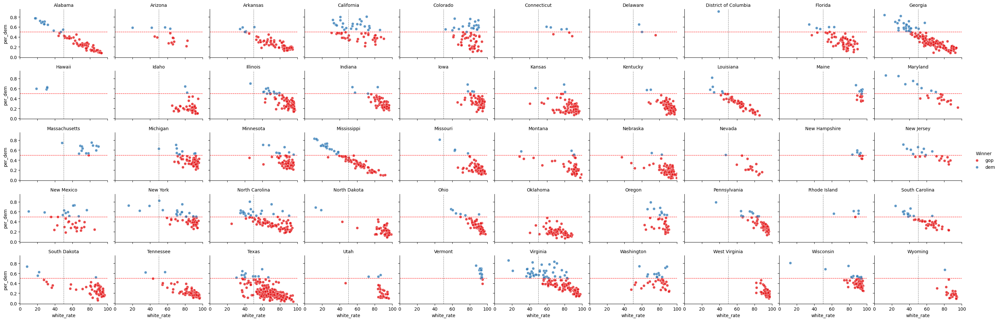

In [134]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f"white_rate", 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f"white_rate", 'per_dem')

plt.show()

##### Porcentaje de población negra (Black) por condado

In [135]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=plot_data['county_fips'],
                    color='black_rate',
                    hover_name=plot_data['county'],
                    scope='usa'
                   )


# Layout sin plantilla y con fondo transparente
fig.update_layout(
    template=None,  # Evita que alguna plantilla añada fondo
    title_text="",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r":0, "t":50, "l":0, "b":0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# Quitar (o minimizar) las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Cargar geojson de fronteras estatales
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()

# Agregar capa de fronteras de estados con líneas más gruesas
fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],  # Sin relleno
    marker_line_width=1,        # Grosor de línea aumentado para fronteras estatales
    marker_line_color="black",  # Color de línea
    showscale=False,            # No mostrar escala para esta capa
    hoverinfo='none'            # Ocultar información al pasar el ratón
))

# Ajustar la visualización geográfica
fig.update_geos(
    # Si usas scope='usa', no es imprescindible center ni projection_scale;
    # pero si ves mucho espacio vacío, puedes forzar un escalado.
    scope='usa',
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)

fig.update_layout(
    coloraxis_showscale=False,  # Ocultar barra de color
    showlegend=False            # Ocultar leyenda
)


# Exportar en PNG y PDF con fondo transparente
fig.write_image("imgs/mapa_county_black.png", scale=10, engine="kaleido")
fig.write_image("imgs/mapa_county_black.pdf", scale=10, engine="kaleido")

# Mostrar en pantalla
fig.show()

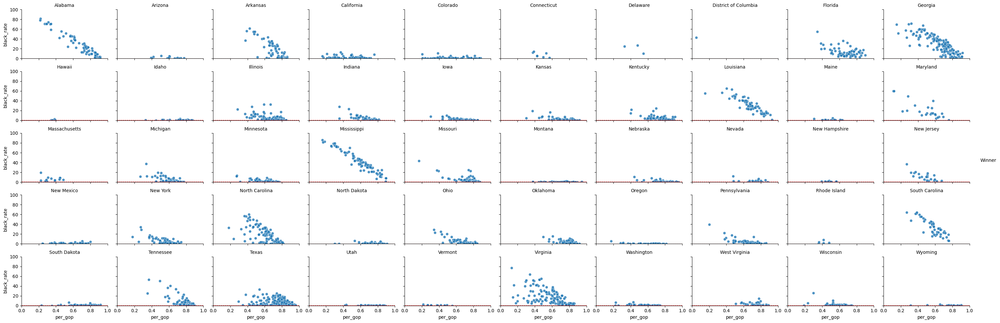

In [136]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', col_wrap=10, height=2, aspect=1.5)
g.map(sns.scatterplot, 'per_gop', 'black_rate', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 1)   # Ajustar el eje X para per_dem (asumiendo que va de 0 a 1)
    ax.set_ylim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('per_gop', 'black_rate')

plt.show()

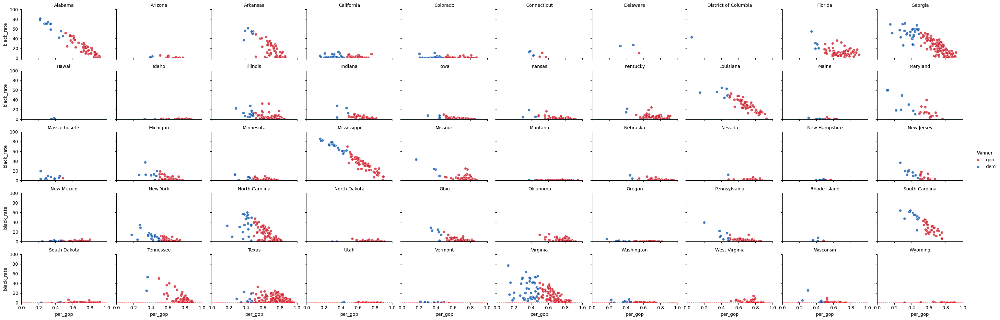

In [137]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#d12533", "dem": "#145bb2"})
g.map(sns.scatterplot, 'per_gop', 'black_rate', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 1)   # Ajustar el eje X para per_dem (asumiendo que va de 0 a 1)
    ax.set_ylim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('per_gop', 'black_rate')

plt.show()

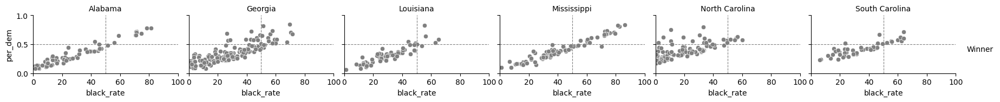

In [138]:
# Lista de estados a mostrar (modifica según tus necesidades)
selected_states = ['Alabama', 'Mississippi', 'Louisiana', 'North Carolina', 'South Carolina', 'Georgia']

# Filtrar el DataFrame para incluir solo los estados seleccionados
filtered_data = plot_data[plot_data['state'].isin(selected_states)]

# Crear gráfico FacetGrid con los estados filtrados
g = sns.FacetGrid(filtered_data, col='state', col_wrap=len(selected_states), 
                  height=2, aspect=1.5)
g.map(sns.scatterplot, 'black_rate', 'per_dem', color="gray", alpha=1)

# Añadir líneas horizontales y verticales
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='gray', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_ylim(0, 1)   # Ajustar el eje X para per_gop (asumiendo que va de 0 a 1)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('black_rate', 'per_dem')

plt.show()


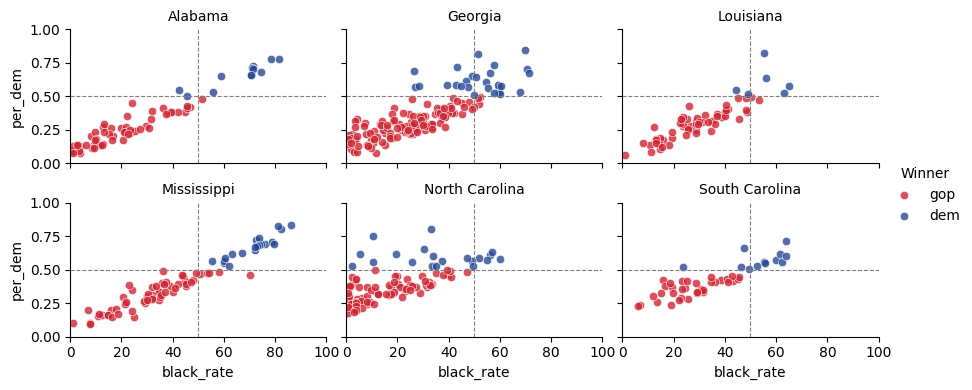

In [139]:
# Lista de estados a mostrar (modifica según tus necesidades)
selected_states = ['Alabama', 'Mississippi', 'Louisiana', 'North Carolina', 'South Carolina', 'Georgia']

# Filtrar el DataFrame para incluir solo los estados seleccionados
filtered_data = plot_data[plot_data['state'].isin(selected_states)]

# Crear gráfico FacetGrid con los estados filtrados
g = sns.FacetGrid(filtered_data, col='state', hue="winner", col_wrap=int(len(selected_states)//2), 
                  height=2, aspect=1.5, palette={"gop": "#d12533", "dem": "#254995"})
g.map(sns.scatterplot, 'black_rate', 'per_dem', alpha=0.8)

# Añadir líneas horizontales y verticales
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='gray', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_ylim(0, 1)   # Ajustar el eje X para per_gop (asumiendo que va de 0 a 1)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('black_rate', 'per_dem')

# Guardar el gráfico en PDF y PNG con fondo transparente
g.fig.savefig('imgs/scatter_black.pdf', transparent=True)
g.fig.savefig('imgs/scatter_black.png', transparent=True)

plt.show()


##### Porcentaje de población hispana (Hispanic) por condado

In [140]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='hispanic_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población hispana por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


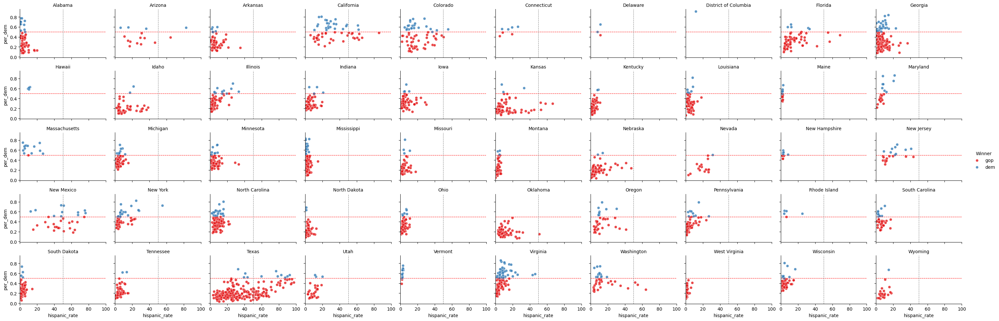

In [141]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f"hispanic_rate", f"per_dem", alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f"hispanic_rate", f"per_dem")

plt.show()

##### Porcentaje de población asiática (Asian) por condado

In [142]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='asian_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población asiática por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


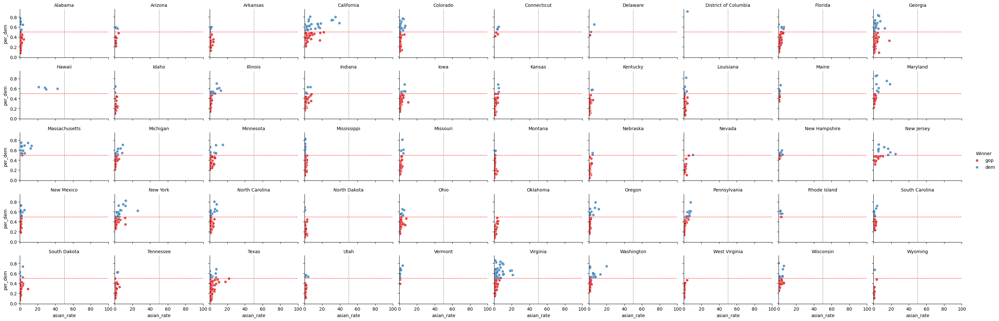

In [143]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'asian_rate', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('asian_rate', 'per_dem')

plt.show()

##### Porcentaje de población nativa (Native) por condado

In [144]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='native_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población nativa por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


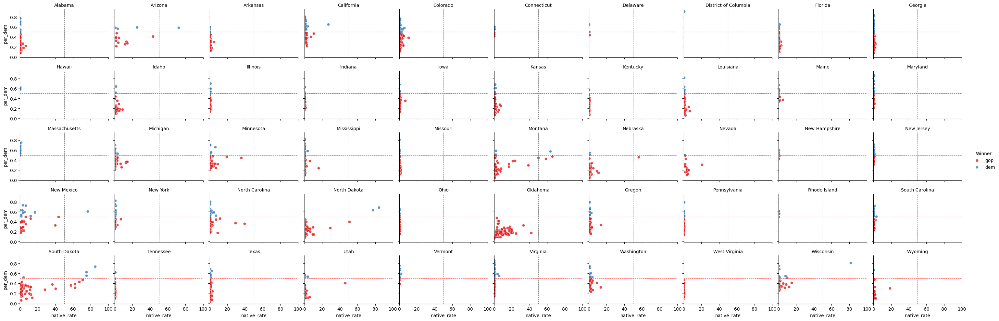

In [145]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'native_rate', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('native_rate', 'per_dem')

plt.show()

#### Economía

##### Median income

In [146]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=plot_data['county_fips'],
                    color=plot_data['median_income'],
                    hover_name=plot_data['county'],
                    scope='usa',
                    range_color=(0, plot_data['median_income'].max())
                   )

# Layout sin plantilla y con fondo transparente
fig.update_layout(
    template=None,  # Evita que alguna plantilla añada fondo
    title_text="",
    title_x=0.5,
    width=1200,
    height=800,
    margin={"r":0, "t":50, "l":0, "b":0},
    paper_bgcolor='rgba(0,0,0,0)',
    plot_bgcolor='rgba(0,0,0,0)'
)

# Quitar (o minimizar) las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Cargar geojson de fronteras estatales
url_states = 'https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json'
states_geojson = requests.get(url_states).json()

# Agregar capa de fronteras de estados con líneas más gruesas
fig.add_trace(go.Choropleth(
    geojson=states_geojson,
    locations=[feature['id'] for feature in states_geojson['features']],
    z=[0] * len(states_geojson['features']),
    colorscale=[[0, 'rgba(0,0,0,0)'], [1, 'rgba(0,0,0,0)']],  # Sin relleno
    marker_line_width=1,        # Grosor de línea aumentado para fronteras estatales
    marker_line_color="black",  # Color de línea
    showscale=False,            # No mostrar escala para esta capa
    hoverinfo='none'            # Ocultar información al pasar el ratón
))

# Ajustar la visualización geográfica
fig.update_geos(
    # Si usas scope='usa', no es imprescindible center ni projection_scale;
    # pero si ves mucho espacio vacío, puedes forzar un escalado.
    scope='usa',
    projection=go.layout.geo.Projection(type='albers usa'),
    showland=True,
    landcolor='rgba(0,0,0,0)',   # Tierra transparente
    showocean=True,
    oceancolor='rgba(0,0,0,0)',  # Océano transparente
    showlakes=True,
    lakecolor='rgba(0,0,0,0)',   # Lagos transparentes
    showrivers=True,
    rivercolor='rgba(0,0,0,0)',  # Ríos transparentes
    bgcolor='rgba(0,0,0,0)'      # Fondo geográfico transparente
)

fig.update_layout(
    coloraxis_showscale=False,  # Ocultar barra de color
    showlegend=False            # Ocultar leyenda
)


# Exportar en PNG y PDF con fondo transparente
fig.write_image("imgs/mapa_county_median_income.png", scale=10, engine="kaleido")
fig.write_image("imgs/mapa_county_median_income.pdf", scale=10, engine="kaleido")

# Mostrar en pantalla
fig.show()


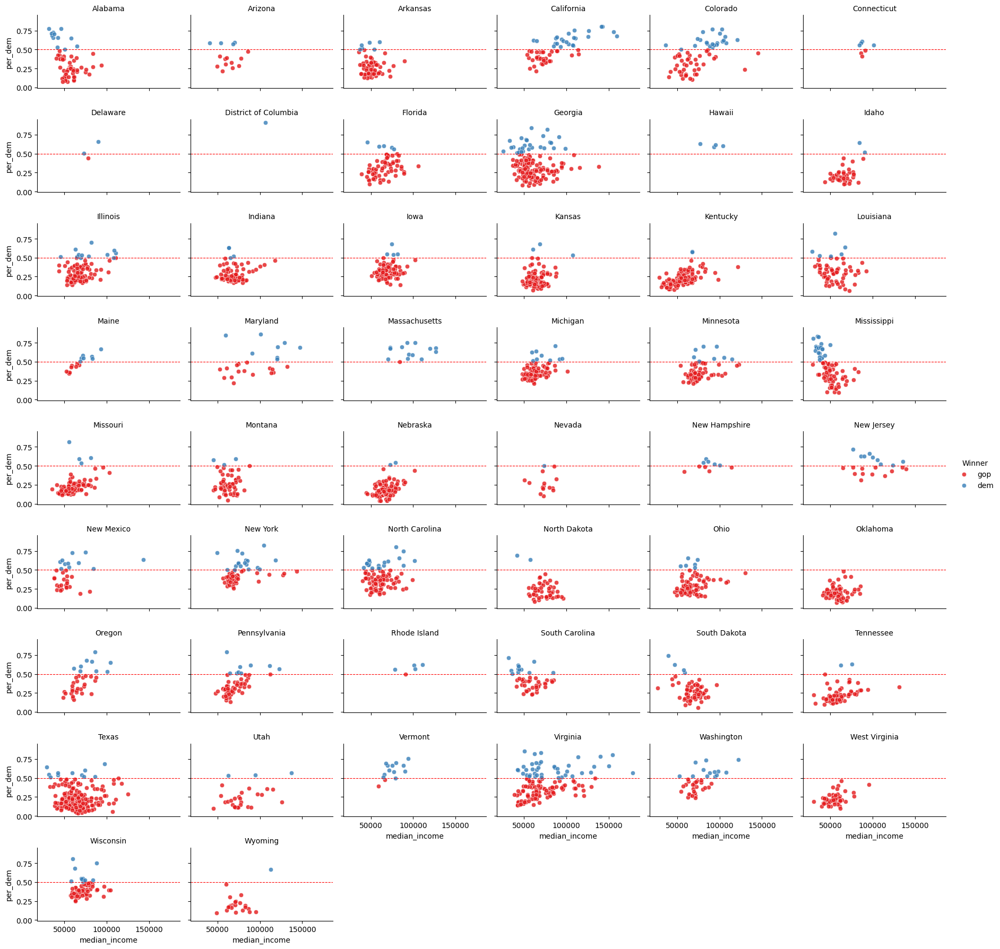

In [147]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data[plot_data['median_income']>=0], col='state', hue=f"winner", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'median_income', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('median_income', 'per_dem')

plt.show()

##### Tasa de Desempleo

In [148]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='unemployment_rate',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la tasa de desempleo por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


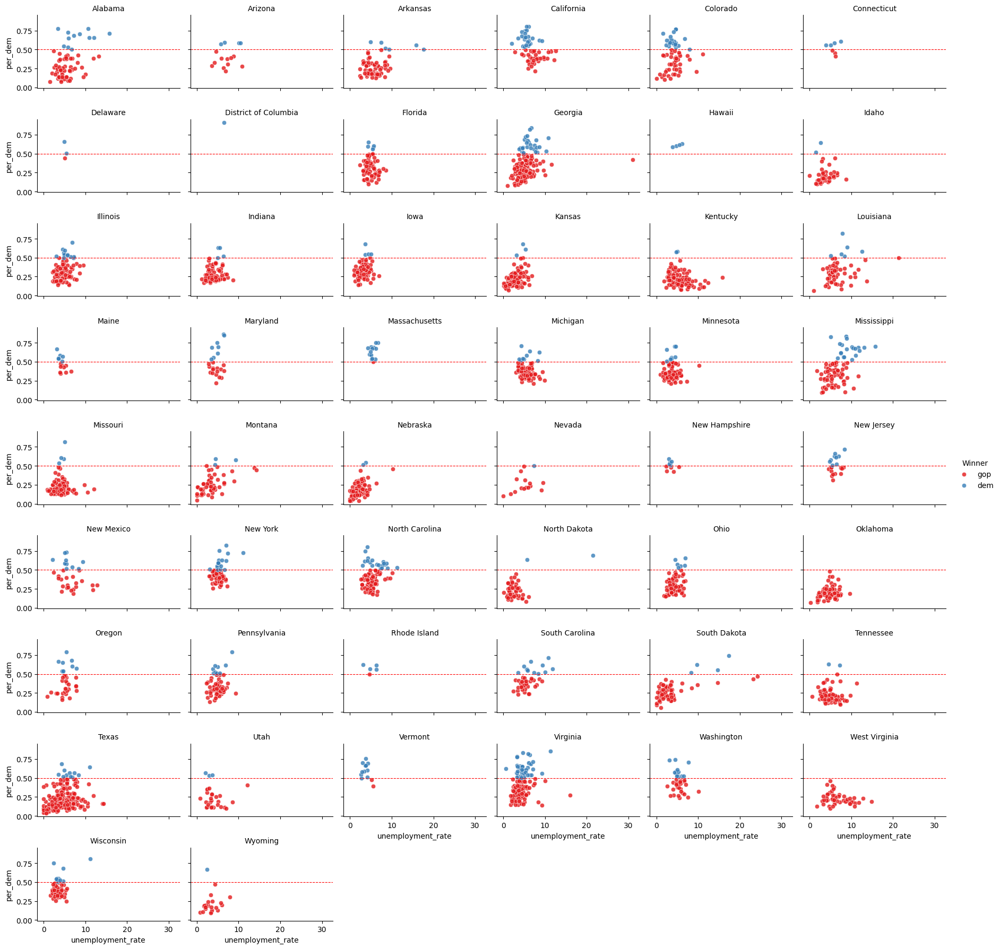

In [149]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'unemployment_rate', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('unemployment_rate', 'per_dem')

plt.show()

#### Tamaño medio de familia

In [150]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color='households_avg_size',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del tamaño medio de familia por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


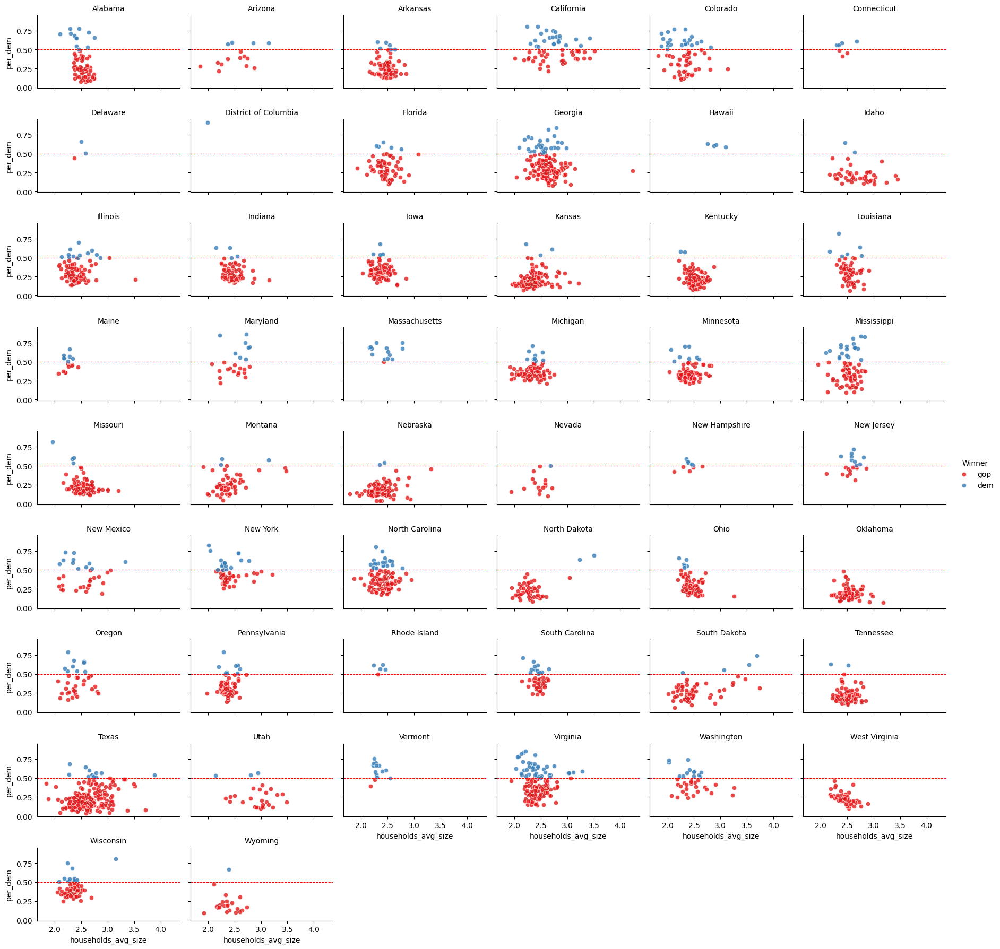

In [151]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, 'households_avg_size', 'per_dem', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('households_avg_size', 'per_dem')

plt.show()

## GIFs

#### Winner -> Black

In [152]:
from PIL import Image

# Cargar las dos imágenes
img1 = Image.open("imgs/mapa_county_black.png").convert("RGBA")
img2 = Image.open("imgs/mapa_county_state_winner.png").convert("RGBA")

# Cantidad de fotogramas en la transición
num_frames = 30

frames = []
for i in range(num_frames+1):
    alpha = i / num_frames  # Va de 0 a 1
    # Combinar imágenes con un factor alpha
    blend = Image.blend(img1, img2, alpha=alpha)
    frames.append(blend)

# Guardar como GIF animado
frames[0].save(
    "imgs/transicion_winner_black_2.gif",
    save_all=True,
    append_images=frames[1:],
    duration=100,  # milisegundos por fotograma
    loop=0
)


/Users/jorgegarcelan/Desktop/T3CHFEST/US-Elections/.venv/lib/python3.9/site-packages/PIL/Image.py:3402: DecompressionBombWarning:

Image size (96000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.



#### Winner -> Median Income

In [153]:
from PIL import Image

# Cargar las dos imágenes
img1 = Image.open("imgs/mapa_county_median_income.png").convert("RGBA")
img2 = Image.open("imgs/mapa_county_state_winner.png").convert("RGBA")

# Cantidad de fotogramas en la transición
num_frames = 30

frames = []
for i in range(num_frames+1):
    alpha = i / num_frames  # Va de 0 a 1
    # Combinar imágenes con un factor alpha
    blend = Image.blend(img2, img1, alpha=alpha)
    frames.append(blend)

# Guardar como GIF animado
frames[0].save(
    "imgs/transicion_winner_median_income.gif",
    save_all=True,
    append_images=frames[1:],
    duration=100,  # milisegundos por fotograma
    loop=0
)


#### Winner -> Bachelors

In [154]:
from PIL import Image

# Cargar las dos imágenes
img1 = Image.open("imgs/mapa_county_bachelors.png").convert("RGBA")
img2 = Image.open("imgs/mapa_county_state_winner.png").convert("RGBA")

# Cantidad de fotogramas en la transición
num_frames = 30

frames = []
for i in range(num_frames+1):
    alpha = i / num_frames  # Va de 0 a 1
    # Combinar imágenes con un factor alpha
    blend = Image.blend(img2, img1, alpha=alpha)
    frames.append(blend)

# Guardar como GIF animado
frames[0].save(
    "imgs/transicion_winner_bachelors.gif",
    save_all=True,
    append_images=frames[1:],
    duration=100,  # milisegundos por fotograma
    loop=0
)
